# LINEAR REGRESSION

## Headsize VS brain weight

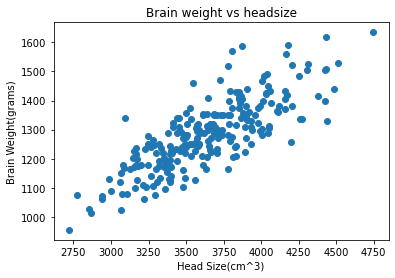

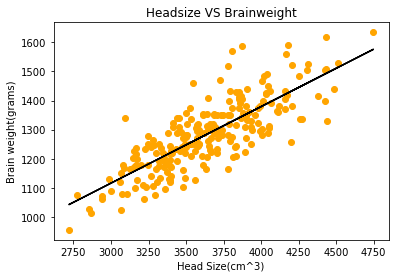

Mean squared error = 2367.495611943946
Accuracy = 0.639311719957
Enter Head Size (in cm^3)4000
Prediced Brain Weight(grams) =  [[1379.29077901]]


In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math

#import dataset
dataset = pd.read_csv("E:\\ML Zero to Hero\\headbrain.csv")

#printing starting 10 rows to analyze data
#print(dataset.head())

x=dataset["Head Size(cm^3)"]
y=dataset["Brain Weight(grams)"]

#print(x.head())
#print(y.head())


#scatter plot the given data
plt.scatter(x,y)
plt.title("Brain weight vs headsize")
plt.xlabel("Head Size(cm^3)")
plt.ylabel("Brain Weight(grams)")
plt.show()

#Reshaping the input into 1D array
X = np.array(x).reshape(-1,1)
Y = np.array(y).reshape(-1,1)


#training the model
from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(X,Y)

#visualizing the predicted model
plt.scatter(x,y,color='orange')
plt.plot(X,LR.predict(X),color='black')
plt.title("Headsize VS Brainweight")
plt.xlabel("Head Size(cm^3)")
plt.ylabel("Brain weight(grams)")
plt.show()

#finding accuracy
from sklearn.metrics import mean_squared_error
MSE = mean_squared_error(X,Y)
MSE = math.sqrt(MSE)

#finding the accuracy
acc = LR.score(X,Y)

print("Mean squared error = " + str(MSE))
print("Accuracy = " + str(acc))

#predict result using the trained model
Headsize = int(input("Enter Head Size (in cm^3)"))
brainweight=LR.predict([[Headsize]])
print("Prediced Brain Weight(grams) = ", brainweight)

# MULTI LINEAR REGRESSION

***50 STARTUP.CSV model training, where there are multiple features and one target***

Accuracy of our model =  98.0


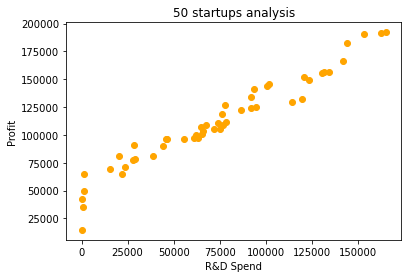

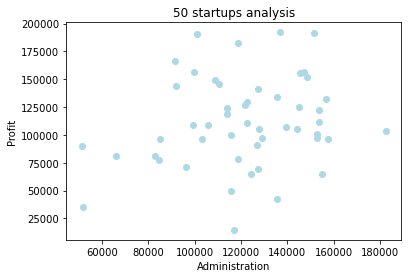

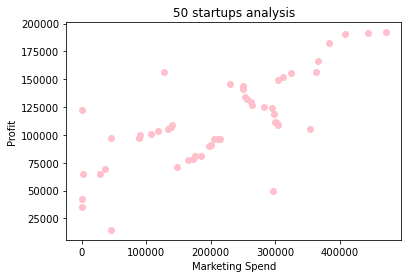

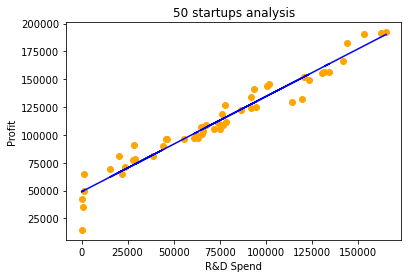

Input R&D spend : 75000
For given R&D Spend, Profit will be  [[113104.75196166]]


In [47]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression


dataset = pd.read_csv("E:\\ML Zero to Hero\\mlzero_to_hero-main\\05 Multiple Linear Regression\\50_Startups.csv")

#separate features and target
x = dataset[["R&D Spend","Administration","Marketing Spend","State"]].values
y = dataset[["Profit"]].values

#we have to encode the state column using OneHoEncoder
state = ColumnTransformer([("State", OneHotEncoder(), [3])], remainder='passthrough')
x = state.fit_transform(x)


#Splitting dataset into train and test set
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(x,y,test_size=0.3, random_state=0)


#Training the model
LR = LinearRegression()
LR.fit(X_train, Y_train)

#Predicting the model
y_pred = LR.predict(X_test)


#finding accuracy using formula
acc = (y_pred.sum().mean() / Y_test.sum().mean())
print("Accuracy of our model = ", round(acc*100))


x1 = dataset[["R&D Spend"]].values
x2=dataset[["Administration"]].values
x3=dataset[["Marketing Spend"]].values


#Visualizing different dataset w.r.t target variable
plt.scatter(x1, y, color='orange')
plt.title("50 startups analysis")
plt.xlabel("R&D Spend")
plt.ylabel("Profit")
plt.show()

plt.scatter(x2,y,color='lightblue')
plt.title("50 startups analysis")
plt.xlabel("Administration")
plt.ylabel("Profit")
plt.show()

plt.scatter(x3, y, color='pink')
plt.title("50 startups analysis")
plt.xlabel("Marketing Spend")
plt.ylabel("Profit")
plt.show()

#We can see that Profit has linear relation with R&D Spend, so lets predict some linear model
RD_x=dataset[["R&D Spend"]].values
RD_y=dataset[["Profit"]].values

from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(RD_x, RD_y)

#visualizing plot
plt.scatter(RD_x, RD_y, color='orange')
plt.plot(RD_x, LR.predict(RD_x), color='blue')
plt.title("50 startups analysis")
plt.xlabel("R&D Spend")
plt.ylabel("Profit")
plt.show()

#Predicting target for new input
RD = int(input("Input R&D spend : "))
profit = LR.predict([[RD]])
print("For given R&D Spend, Profit will be ", profit)

# POLYNOMIAL REGRESSION

***Analyzing Drug Performance using Polynomial Regression***

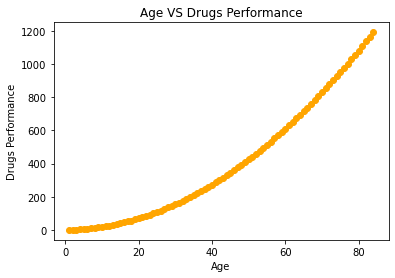

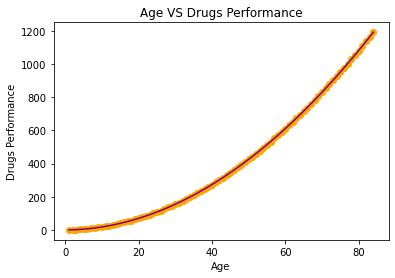

1.0
Enter age : 40
Drugs Performance =  [[274.16666667]]


In [66]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math


#importing dataset
dataset = pd.read_csv("E:\\ML Zero to Hero\\mlzero_to_hero-main\\06_Polynomial_Regression\\Drugs_Performance.csv")

#separating features and target
x = dataset[["Age"]].values
y = dataset[["Drugs_Perf"]].values

#Visualizing scattered plot
plt.scatter(x,y, color='orange')
plt.title("Age VS Drugs Performance")
plt.xlabel("Age")
plt.ylabel("Drugs Performance")
plt.show()

#training model
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(degree = 2)
X_poly = poly.fit_transform(x)
poly.fit(X_poly, y)

LR = LinearRegression()
LR.fit(X_poly, y)

plt.scatter(x,y, color='orange')
plt.plot(x, LR.predict(poly.fit_transform(x)), color='purple')
plt.title("Age VS Drugs Performance")
plt.xlabel("Age")
plt.ylabel("Drugs Performance")
plt.show()

#finding accuracy and error
acc = LR.score(_poly, y)
print(acc)

#Prediction
age = int(input("Enter age : "))
drugs_per = LR.predict(poly.fit_transform([[age]]))
print("Drugs Performance = ", drugs_per)

# SUPPORT VECTOR MACHINE (REGRESSION)

***POSITION SALARIES ANALYSIS - predict salary on the basis of position***

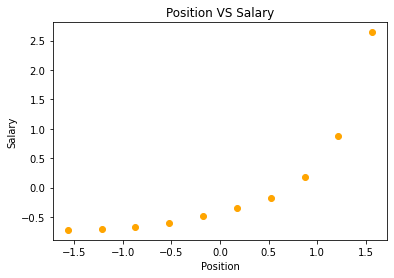

C:\Users\dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


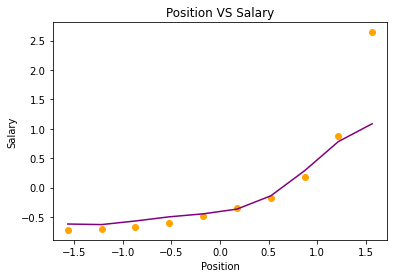

Enter position level : 5
Predicted by model =  [122574.52250599]


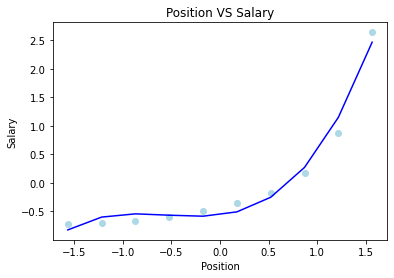

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

#reading dataset
dataset = pd.read_csv("E:\\ML Zero to Hero\\mlzero_to_hero-main\\07_Support_Vector_Regression\\Position_Salaries.csv")
dataset.head(10)

#separating features and target
x = dataset[["Level"]].values
y = dataset[["Salary"]].values


#Scaling features
SS_X = StandardScaler()
SS_Y = StandardScaler()
X = SS_X.fit_transform(x)
Y = SS_Y.fit_transform(y)

#Visualize scattered plot
plt.scatter(X,Y,color='orange')
plt.title("Position VS Salary")
plt.xlabel("Position")
plt.ylabel("Salary")
plt.show()

#Training the model
from sklearn.svm import SVR
SVR = SVR(kernel='rbf')
SVR.fit(X,Y)

#Visualizing result
plt.scatter(X, Y, color='orange')
plt.plot(X, SVR.predict(X), color='purple')
plt.title("Position VS Salary")
plt.xlabel("Position")
plt.ylabel("Salary")
plt.show()


#Making prediction
pos = int(input("Enter position level : "))
y_pred = SS_Y.inverse_transform ((SVR.predict(SS_X.transform(np.array([[pos]])))))
print("Predicted by model = ", y_pred)



#====================           IMPLEMENTING POLYNOMIAL REGRESSION ON SAME DATASET                    ===============================#
from sklearn.preprocessing import PolynomialFeatures
poly = PolynomialFeatures(degree = 3)
X_poly = poly.fit_transform(X)
poly.fit(X_poly,Y)


from sklearn.linear_model import LinearRegression
LR = LinearRegression()
LR.fit(X_poly, Y)



#Visualizing the result
plt.scatter(X, Y, color='lightblue')
plt.plot(X, LR.predict(poly.fit_transform(X)), color='blue')
plt.title("Position VS Salary")
plt.xlabel("Position")
plt.ylabel("Salary")
plt.show()


# DECISION TREE (REGRESSION)

***ANALYZE POSITION SALARY.CSV USING TREE BASED REGRESSION***

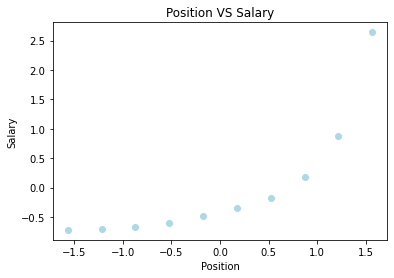

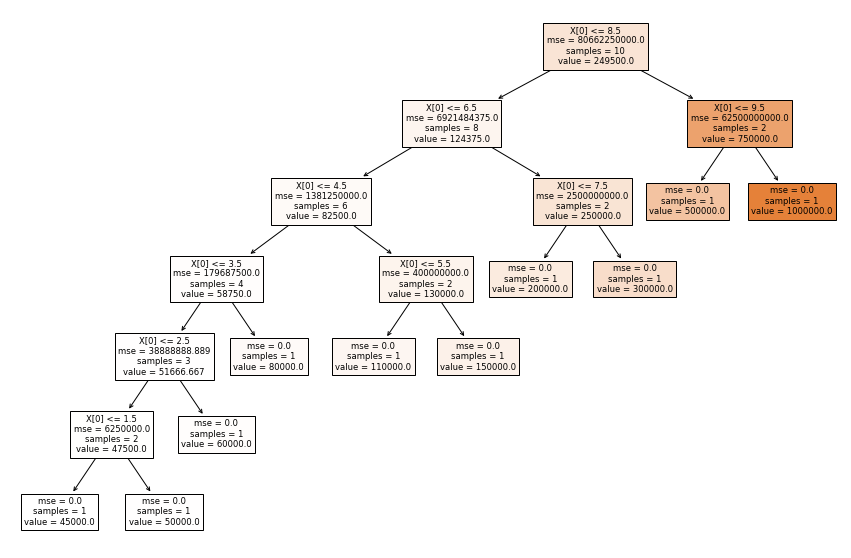

Enter level : 6.5
Estimated salary =  [150000.]
Mean Squared Error =  109601.55108391486
Accuracy =  100.0


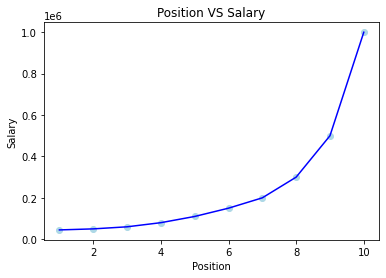

'from dtreeviz.trees import dtreeviz # remember to load the package\n\nviz = dtreeviz(DTR, x, y,\n                target_name="target",\n                feature_names=x.feature_names)\nviz'

In [36]:
#Importing libraries
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt

#Importing dataset
dataset = pd.read_csv("E:\\ML Zero to Hero\\mlzero_to_hero-main\\07_Support_Vector_Regression\\Position_Salaries.csv")


#separating features and target
x = dataset[["Level"]].values
y = dataset[["Salary"]].values


#splitting dataset into train and test set
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test=train_test_split(x,y,test_size=0.2)


#Scaling the features
from sklearn.preprocessing import StandardScaler
SS_X = StandardScaler()
SS_Y = StandardScaler()
X_train = SS_X.fit_transform(X_train)
Y_train = SS_Y.fit_transform(Y_train)
X_test = SS_X.transform(X_test)


#Visualizing scatter plot
plt.scatter(X, Y, color='lightblue')
plt.title("Position VS Salary")
plt.xlabel("Position")
plt.ylabel("Salary")
plt.show()



#Training the decision tree model
from sklearn.tree import DecisionTreeRegressor
DTR = DecisionTreeRegressor(random_state=0)
DTR.fit(x,y)


#Visualizing the tree
from sklearn import tree
plt.figure(figsize=(15,10))
tree.plot_tree(DTR, filled=True)
plt.show()


#Drawing predictions
level=float(input("Enter level : "))
sal=DTR.predict([[level]])
print("Estimated salary = ", sal)


#Finding squared error and accuracy
from sklearn.metrics import mean_squared_error
MSE = mean_squared_error(Y_test, DTR.predict(X_test))
MSE_actual = math.sqrt(MSE)
acc = DTR.score(x,y)
print("Mean Squared Error = ", MSE_actual)
print("Accuracy = ", (acc * 100))




#We can also visualize the plot as well as shown below
plt.scatter(x,y,color='lightblue')
plt.plot(x, DTR.predict(x), color='blue')
plt.title("Position VS Salary")
plt.xlabel("Position")
plt.ylabel("Salary")
plt.show()


#Visualizing using dtreeviz
"""from dtreeviz.trees import dtreeviz # remember to load the package

viz = dtreeviz(DTR, x, y,
                target_name="target",
                feature_names=x.feature_names)
viz"""

# RANDOM FOREST (REGRESSION)

***POSITION VS SALARIES USING RANDOM FOREST***

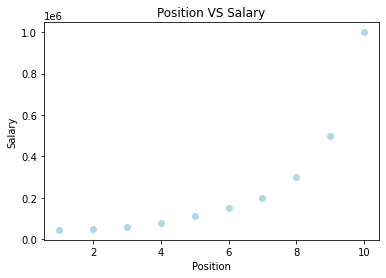

<ipython-input-39-fa690c33f40d>:39: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  RFR.fit(x,y)


100


<ipython-input-39-fa690c33f40d>:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,10))


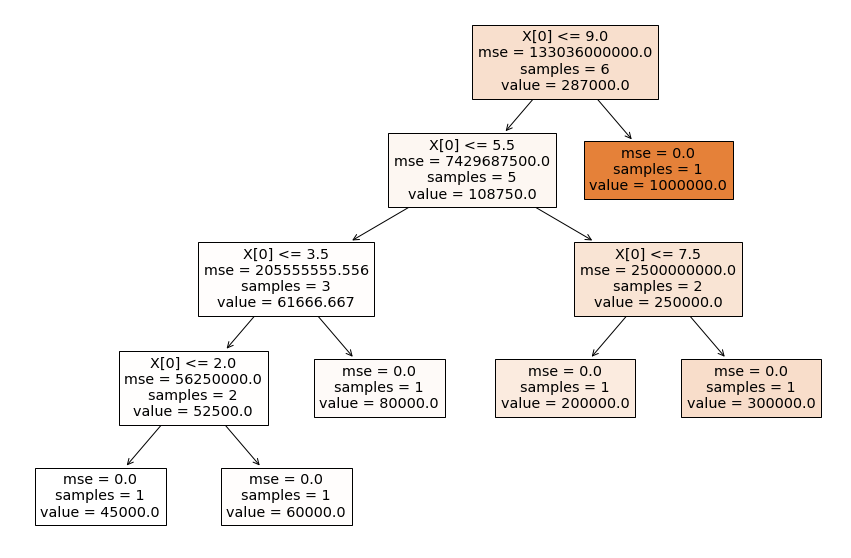

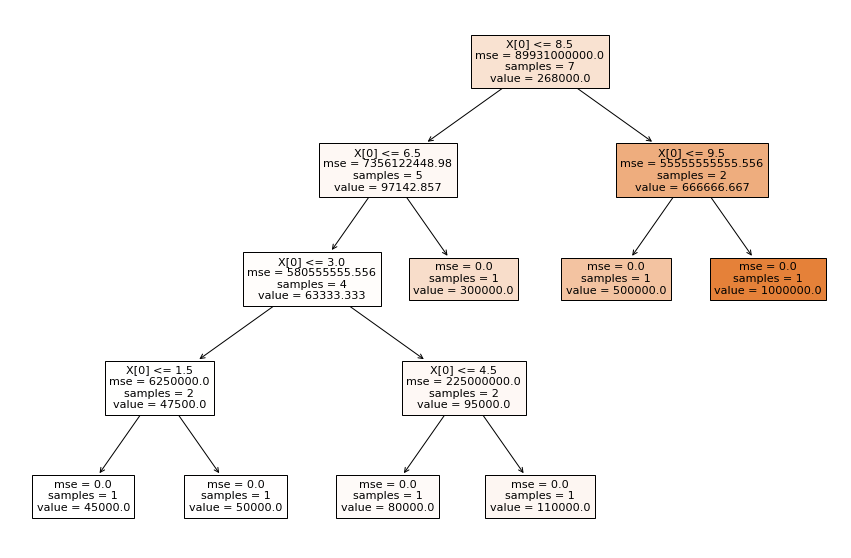

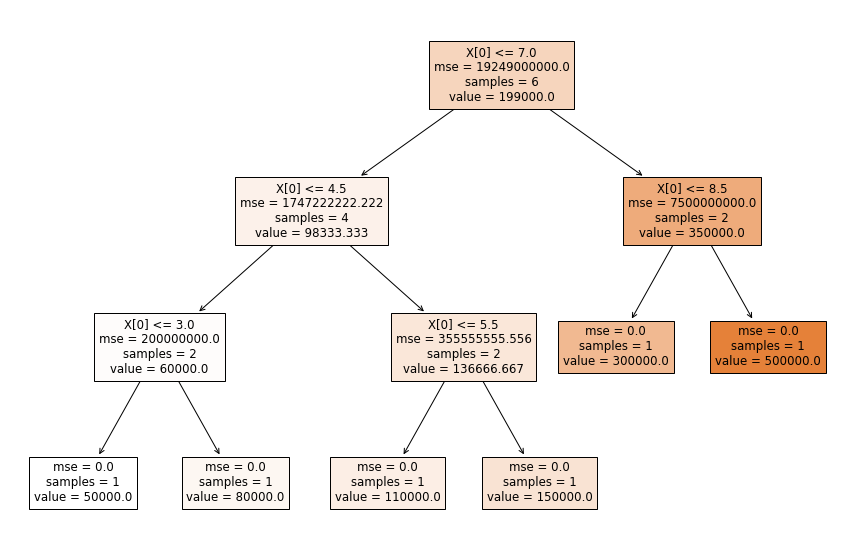

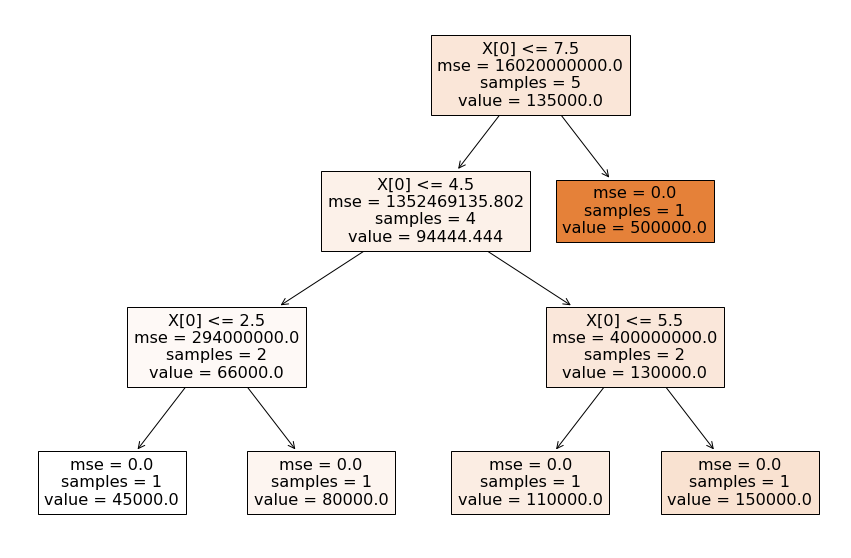

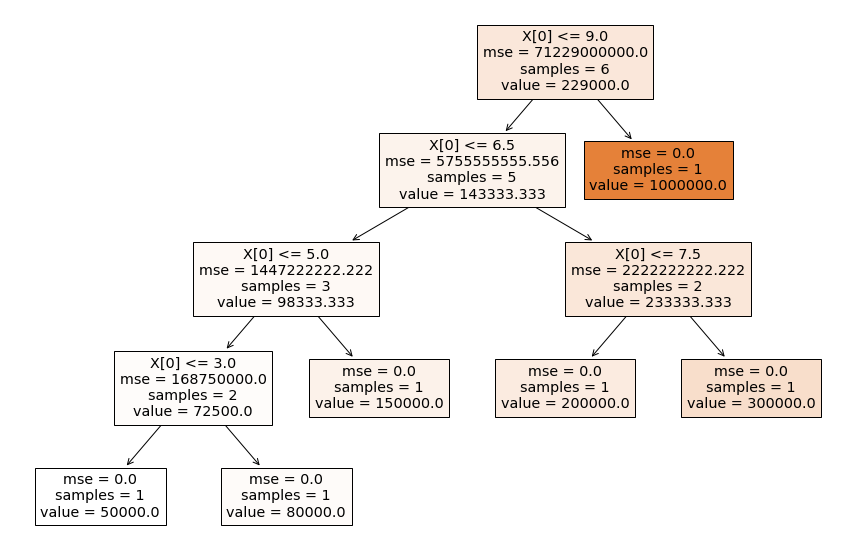

...

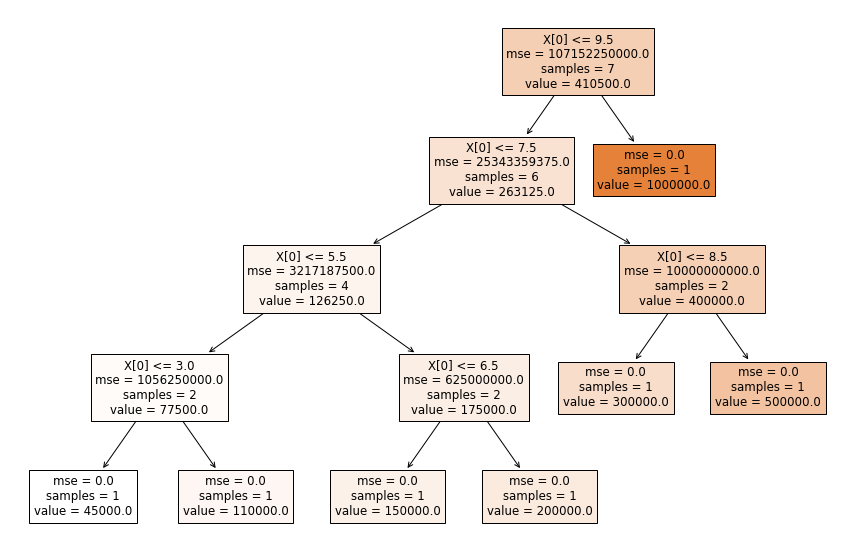

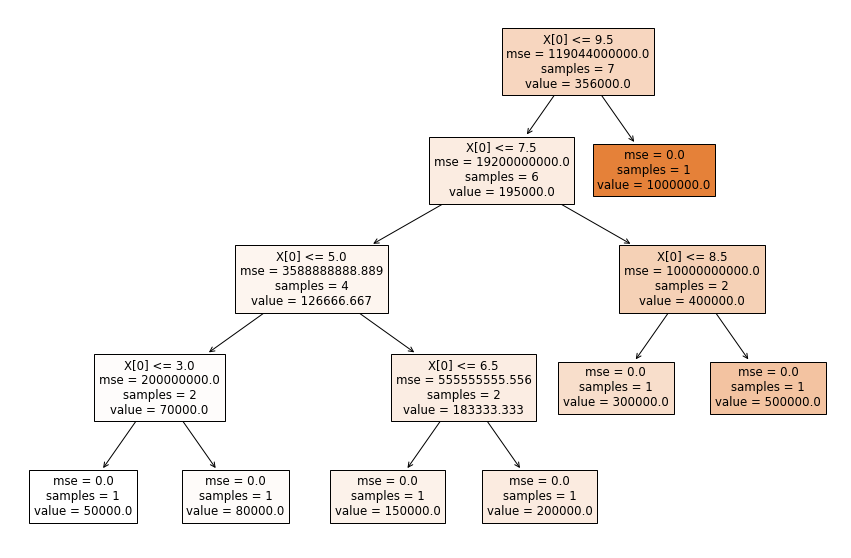

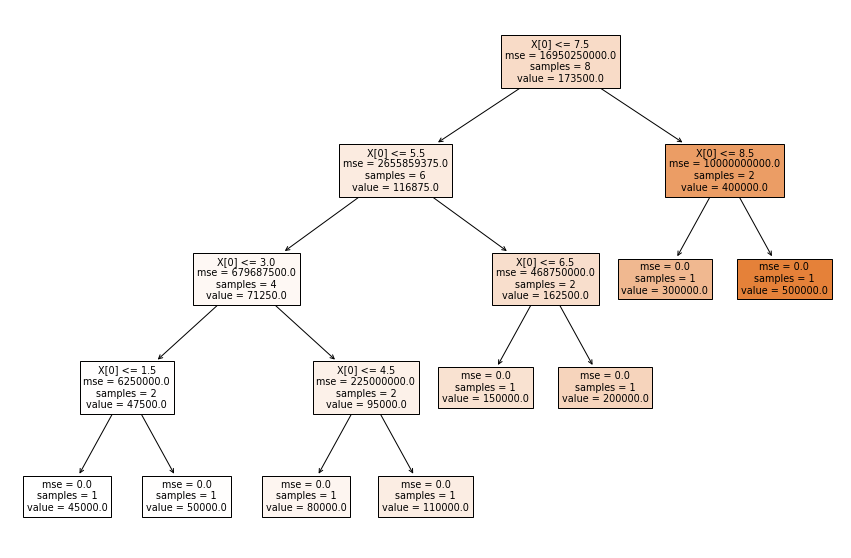

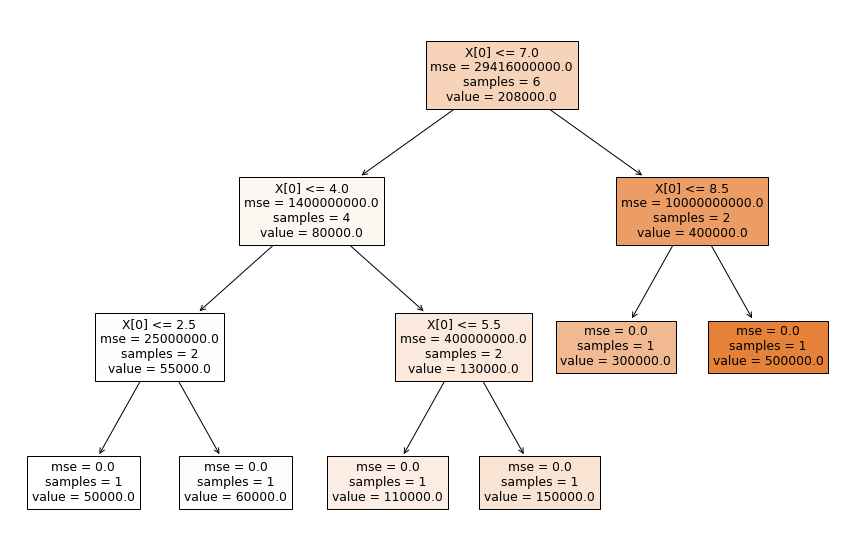

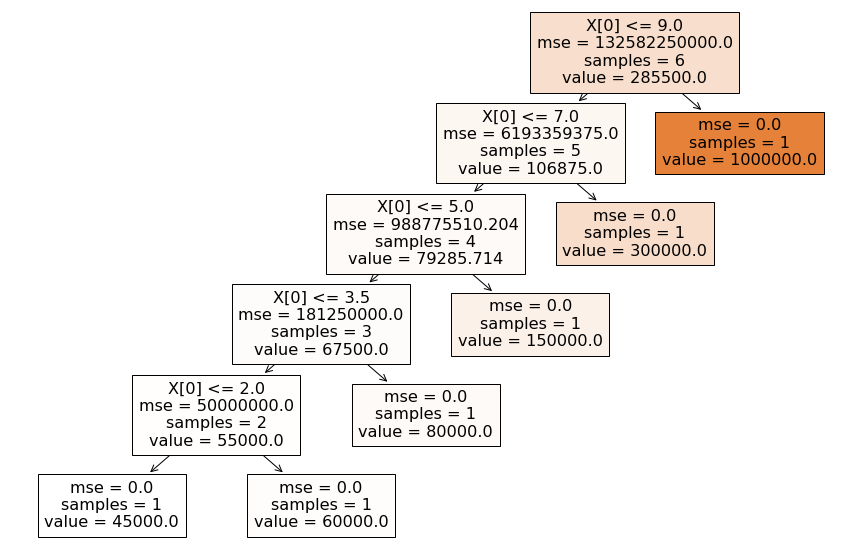

In [39]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt



#importing dataset
dataset = pd.read_csv("E:\\ML Zero to Hero\\mlzero_to_hero-main\\07_Support_Vector_Regression\\Position_Salaries.csv")
x = dataset[["Level"]].values
y = dataset[["Salary"]].values


#splitting dataset into train and test
from sklearn.model_selection import train_test_split
X_train, x_test, Y_train, Y_test = train_test_split(x,y,test_size=0.2)


#Scaling the features
SS_X = StandardScaler()
SS_Y = StandardScaler()
X_train = SS_X.fit_transform(X_train)
Y_train = SS_Y.fit_transform(Y_train)
X_test = SS_X.transform(X_test)


#Visualizing the scattered data
plt.scatter(x,y,color='lightblue')
plt.title("Position VS Salary")
plt.xlabel("Position")
plt.ylabel("Salary")
plt.show()


#Trianing the model
from sklearn.ensemble import RandomForestRegressor
RFR = RandomForestRegressor(random_state=0)
RFR.fit(x,y)


#Get total number of decision tree contained in our model of random forest
print(len(RFR.estimators_))


#Visualizing the random forest
from sklearn import tree
for i in range(0,100):
    plt.figure(figsize=(15,10))
    tree.plot_tree(RFR.estimators_[i], filled=True)

In [41]:
#Predicting result
level = float(input("Enter Level : "))
salary=RFR.predict([[level]])
print("Estimated Salary = ", salary)


#Mean squared error and score
from sklearn.metrics import mean_squared_error
MSE = mean_squared_error(Y_test, RFR.predict(x_test))
acc = RFR.score(x,y)

print("Mean Squared Error = ", (math.sqrt(MSE)))
print("Accuracy = ", round(acc * 100))

Enter Level : 6.5
Estimated Salary =  [158300.]
Mean Squared Error =  5368.891878218446
Accuracy =  94.0


# LOGISTIC REGRESSION

***ANALYZING TITANIC DATASET USING LOGISTIC REGRESSION***

In [13]:
#Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math


#Importing dataset
dataset = pd.read_csv("E:\\ML Zero to Hero\\titanic.csv")

data = dataset[["pclass", "sex", "age", "survived"]]
print(data.tail(10))

#As dataset contain Null values, we have to preprocess it, otherwise it'll create mess in the predictions
print(data.isna().sum(axis=0))


#Removing the null values
data = data.dropna(subset=["sex","pclass","survived"])

#Once doing this, check one more time NaN values
print(data.isna().sum(axis=0))


#Label encoding the gender column
data["sex"] = data["sex"].map({"male":1, "female":0})
data.head(10)

x = data[["pclass","age","sex"]].values
y = data[["survived"]].values


#Age column is necessary for prediction,so we can't neglect it, we have to fill them using some strategy
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values = np.nan, strategy='mean')
X = imputer.fit_transform(x)


#splitting dataset into train and test set
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size=0.2)

"""
#Visualizing the scattered plot
plt.scatter(X, y, color='orange')
plt.title("Logistic regression")
plt.xlabel("")"""


#Training the model
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()
LR.fit(X_train, Y_train)
predictions = LR.predict(X_test)


#Finding the confusion matrix
from sklearn.metrics import mean_squared_error, confusion_matrix
MSE = mean_squared_error(Y_test, predictions)
CM = confusion_matrix(Y_test, predictions)
print(MSE)
print(CM)

      pclass     sex   age  survived
1300     3.0  female  15.0       1.0
1301     3.0    male  45.5       0.0
1302     3.0    male   NaN       0.0
1303     3.0    male   NaN       0.0
1304     3.0  female  14.5       0.0
1305     3.0  female   NaN       0.0
1306     3.0    male  26.5       0.0
1307     3.0    male  27.0       0.0
1308     3.0    male  29.0       0.0
1309     NaN     NaN   NaN       NaN
pclass        1
sex           1
age         264
survived      1
dtype: int64
pclass        0
sex           0
age         263
survived      0
dtype: int64


C:\Users\dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


# K-NEAREST NEIGHBORS (REGRESSION)

***CLASSIFICATION USING KNN ON CREDIT DATASET***

income     0
age        0
loan       0
default    0
dtype: int64


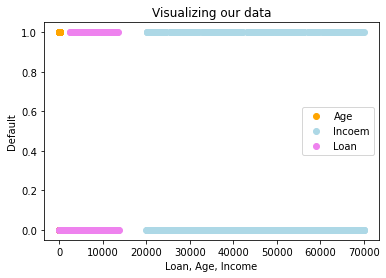

<ipython-input-22-d7848e4c03b9>:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  fitmodel=model.fit(X_train,Y_train)


Accuracy =  99.0


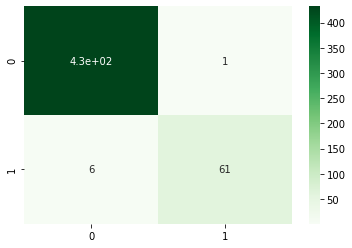

In [22]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt

#importing dataset
dataset=pd.read_csv("E:\\ML Zero to Hero\\mlzero_to_hero-main\\10_K_Nearest_Neighbors\\credit_data.csv")

#observing dataset
data = dataset[["income","age","loan","default"]]

print(data.isna().sum(axis=0))
data.head()


#extracting features and target
x = data[["income","age","loan"]].values
y = data[["default"]].values



#Visualing scattered relation between different features and our target variable
plt.scatter(data.age, data.default, color='orange')
plt.scatter(data.income, data.default, color='lightblue')
plt.scatter(data.loan, data.default, color='violet')
plt.title("Visualizing our data")
plt.xlabel("Loan, Age, Income")
plt.ylabel("Default")
plt.legend(["Age","Incoem","Loan"])
plt.show()



#pre-processing data
from sklearn.preprocessing import MinMaxScaler
x = MinMaxScaler().fit_transform(x)


#splitting data into train and test set
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(x,y)




"""cross_valid_score=[]
#Cross Validation Score is used to find out the optimal value of k, as follows
from sklearn.model_selection import cross_val_score
for k in range(1,100):
    knn = KNeighborsClassifier(n_neighbors = k)
    score = cross_val_score(knn, x, y, cv=10, scoring='accuracy')
    cross_valid_score.append(score.mean())
    
    
print("Optimal K value with cross validation test : \t", np.argmax(cross_valid_score))

"""

#training the model
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=32)
fitmodel=model.fit(X_train,Y_train)
predictions = fitmodel.predict(X_test)


#Printing error, accuracy and confusion matrix
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error
#mean squared error is not in classification problems, bcz it has result only 1 and 0
#MSE = mean_squared_error(Y_test, predictions)
acc = accuracy_score(Y_test, predictions)
CM = confusion_matrix(Y_test, predictions)


#Visualizing confusion matrix
import seaborn as sb
sb.heatmap(confusion_matrix(Y_test, predictions), annot=True, cmap='Greens')


print("Accuracy = ", round(acc*100))

# SUPPORT VECTOR MACHINE (CLASSIFICATION)

***IMPLEMENTING CLASSIFICATION MODEL OF SUPPORT VECTOR MACHINE ON DATASET FROM SKLEARN MODULE***

Accuracy =  95.0
Confusion Matrix : 
 [[42  0  0  0  1  0  0  0  0  0]
 [ 0 46  0  0  0  0  0  0  0  0]
 [ 0  0 43  0  0  0  0  0  0  0]
 [ 0  0  0 37  0  2  0  2  6  0]
 [ 0  0  0  0 45  0  0  0  1  2]
 [ 0  0  0  0  0 44  1  0  0  0]
 [ 0  0  0  0  0  0 47  0  0  0]
 [ 0  0  0  0  0  0  0 44  1  0]
 [ 0  2  0  0  0  0  0  0 38  1]
 [ 0  0  0  1  0  1  0  1  1 41]]
Prediction for test image :  [2]


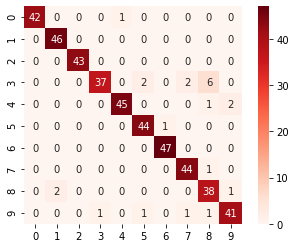

In [69]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


#Using dataset from sklearn
from sklearn import datasets

digits = datasets.load_digits()
#print(digits)

#separating images and label
images_and_labels = list(zip(digits.images, digits.target))
#print(digits.images)

n_samples = len(digits.images)
data = digits.images.reshape((n_samples, -1))

#Train test split, fetching 75% of the data
trainTestSplit = int(n_samples * 0.75)


#Training the model
from sklearn.svm import SVC
model = SVC()
model.fit(data[:trainTestSplit], digits.target[:trainTestSplit])


#Getting target and predictions
target = digits.target[trainTestSplit:]
predictions = model.predict(data[trainTestSplit:])


#Printing score and confusion matrix
from sklearn.metrics import accuracy_score, confusion_matrix
print("Accuracy = ", (round((accuracy_score(target, predictions))*100)))
print("Confusion Matrix : \n", confusion_matrix(target, predictions))


#Visualizing the confusion matrix
import seaborn as sbn
sbn.heatmap(confusion_matrix(target, predictions), annot=True, cmap='Reds')



#Predictions
import matplotlib.cm as cm
plt.imshow(digits.images[-55], cmap=plt.cm.gray_r, interpolation='nearest')
print("Prediction for test image : ", model.predict(data[-55].reshape(1,-1)))

plt.show()

# NAIVE BAYES CLASSIFIER (CLASSIFICATION)

***NAIVE BAYES CLASSIFIER works on the principle of Conditional probability***

clientid    0
income      0
age         0
loan        0
LTI         0
default     0
dtype: int64
Accuracy =  93.0


C:\Users\dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


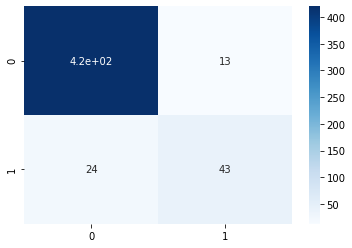

In [80]:
#Importing necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd


#Importing datset
dataset = pd.read_csv("E:\\ML Zero to Hero\\mlzero_to_hero-main\\10_K_Nearest_Neighbors\\credit_data.csv")


#Preprocessing data
print(dataset.isna().sum(axis=0))

#Separating features and target
x = dataset[["income","age","loan"]].values
y = dataset[["default"]].values

#Splitting training and test set
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(x,y)

#Training the model
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model = model.fit(X_train, Y_train)
predictions = model.predict(X_test)


#Finding accuracy_score and confusion matrix
from sklearn.metrics import accuracy_score, confusion_matrix
CM = confusion_matrix(Y_test, predictions)
acc = accuracy_score(Y_test, predictions)
print("Accuracy = ", (round(acc*100)))



#Visualizing the confusion matrix
import seaborn as sbn
sbn.heatmap(confusion_matrix(Y_test, predictions), annot=True, cmap='Blues')

# DECISION TREE (CLASSIFICATION)

***IMPLEMENTING DECISION TREE CLASSIFIER ON PIMA-INDIANS-DIABIETIES PREDICTION - on the basis of some factors whether patient has diabities or not***

Accuracy score =  72.0
Confusion matrix = 
 [[93 20]
 [33 46]]




Accuracy score =  0.7552083333333334
Confusion matrix = 
 [[105  25]
 [ 22  40]]


C:\Users\dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


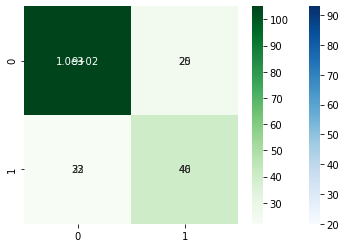

In [18]:
#Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

#Importing dataset
dataset = pd.read_csv("E:\\ML Zero to Hero\\pima-indians-diabetes.csv")
#dataset.head(10)

#Extracting features and target
x = dataset.iloc[:, :8].values
y = dataset.iloc[:, 8:].values

#Splitting dataset into train and test set
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(x, y)

#Training our model
from sklearn.tree import DecisionTreeClassifier
DTC = DecisionTreeClassifier()
model = DTC.fit(X_train, Y_train)
predictions = model.predict(X_test)


#Finding accuracy and evaluate our model
from sklearn.metrics import accuracy_score, confusion_matrix
acc = accuracy_score(Y_test, predictions)
CM = confusion_matrix(Y_test, predictions)

print("Accuracy score = ", (round(acc*100)))
print("Confusion matrix = \n", CM)

#Visualizing the confusion matrix
import seaborn as sbn
sbn.heatmap(confusion_matrix(Y_test, predictions), annot=True, cmap='Blues')
print("\n\n\n")








#=========================================              NAIVE BAYES GIVES BETTER RESULTS                          ==============================================
#importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#Importing dataset
dataset1 = pd.read_csv("E:\\ML Zero to Hero\\pima-indians-diabetes.csv")



#Extracting features and target variable
x1 = dataset1.iloc[:, :8].values
y1 = dataset1.iloc[:, 8:].values


#Splititng dataset into train and test set
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(x1,y1)


#Training the model
from sklearn.naive_bayes import GaussianNB
NB = GaussianNB()
model1 = NB.fit(X_train1, Y_train1)
predictions1 = model1.predict(X_test1)


print("Accuracy score = ", (accuracy_score(Y_test1, predictions1)))
print("Confusion matrix = \n", confusion_matrix(Y_test1, predictions1))


#Visualizing confusion matrix
sbn.heatmap(confusion_matrix(Y_test1, predictions1), annot=True, cmap='Greens')


# RANDOM FOREST (CLASSIFICATION)

***IMPLEMENTING RANDOM FOREST CLASSIFIER ON MASHROOM.CSV DATASET TO EVALUATE WHETHER MASHROOM FALL INTO HEALTH BENEFICIAL OR HEALTH INJURIOUS CATEGORY***

class =>	 ['p' 'e']
cap-shape =>	 ['x' 'b' 's' 'f' 'k' 'c']
cap-surface =>	 ['s' 'y' 'f' 'g']
cap-color =>	 ['n' 'y' 'w' 'g' 'e' 'p' 'b' 'u' 'c' 'r']
bruises =>	 ['t' 'f']
odor =>	 ['p' 'a' 'l' 'n' 'f' 'c' 'y' 's' 'm']
gill-attachment =>	 ['f' 'a']
gill-spacing =>	 ['c' 'w']
gill-size =>	 ['n' 'b']
gill-color =>	 ['k' 'n' 'g' 'p' 'w' 'h' 'u' 'e' 'b' 'r' 'y' 'o']
stalk-shape =>	 ['e' 't']
stalk-root =>	 ['e' 'c' 'b' 'r' '?']
stalk-surface-above-ring =>	 ['s' 'f' 'k' 'y']
stalk-surface-below-ring =>	 ['s' 'f' 'y' 'k']
stalk-color-above-ring =>	 ['w' 'g' 'p' 'n' 'b' 'e' 'o' 'c' 'y']
stalk-color-below-ring =>	 ['w' 'p' 'g' 'b' 'n' 'e' 'y' 'o' 'c']
veil-type =>	 ['p']
veil-color =>	 ['w' 'n' 'o' 'y']
ring-number =>	 ['o' 't' 'n']
ring-type =>	 ['p' 'e' 'l' 'f' 'n']
spore-print-color =>	 ['k' 'n' 'u' 'h' 'w' 'r' 'o' 'y' 'b']
population =>	 ['s' 'n' 'a' 'v' 'y' 'c']
habitat =>	 ['u' 'g' 'm' 'd' 'p' 'w' 'l']


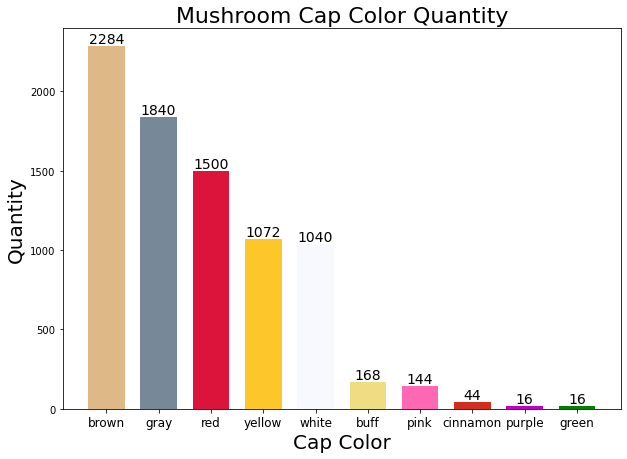

[[5 2 4 ... 2 3 5]
 [5 2 9 ... 3 2 1]
 [0 2 8 ... 3 2 3]
 ...
 [2 2 4 ... 0 1 2]
 [3 3 4 ... 7 4 2]
 [5 2 4 ... 4 1 2]]
[[1]
 [0]
 [0]
 ...
 [0]
 [1]
 [0]]


<ipython-input-58-c22b7d3c4bb4>:87: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  pd.DataFrame(x).hist(ax=ax)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:531: DataConversionWarning: A column-vector y was pa

In [ ]:
#Improting necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt



#Loading the dataset
dataset = pd.read_csv("E:\\ML Zero to Hero\\mushrooms.csv")
#print(dataset.isna().sum(axis=0))
dataset.head()



#Extracting unique values of each column
for i in dataset:
    print(f'{i} =>\t {dataset[i].unique()}')

          
          
#Getting number of mushrooms for each cap color
cap_colors = dataset['cap-color'].value_counts()
#print(cap_colors)


#Converting cap color values into list
m_height = cap_colors.values.tolist()
#print(m_height)


#COnverting cap colors into list
#print(cap_colors.axes)
cap_color_labels = cap_colors.axes[0].tolist()
#print(cap_color_labels)


#Some advance data visualization
ind = np.arange(10)
width = 0.7
colors = ['#DEB887','#778899','#DC143C','#FEC729','#f8f8ff','#F0DC82','#FF69B4','#D22D1E','#C000C5','g']
fig, ax = plt.subplots(figsize=(10,7))
mushroom_bars=ax.bar(ind, m_height, width, color=colors)
ax.set_xlabel("Cap Color", fontsize=20)
ax.set_ylabel("Quantity", fontsize=20)
ax.set_title("Mushroom Cap Color Quantity", fontsize=22)
ax.set_xticks(ind)
ax.set_xticklabels(('brown', 'gray', 'red', 'yellow', 'white', 'buff', 'pink', 'cinnamon', 'purple', 'green'),fontsize=12)
def autolabel(rects, fontsize=14):
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2, 1*height, '%d' % int(height),ha='center', va='bottom', fontsize=fontsize)

autolabel(mushroom_bars)
plt.show()


#Preprocessing dataset
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
for column in dataset.columns:
    dataset[column] = labelencoder.fit_transform(dataset[column])
    
    
#dataset


#Evaluating 'class' column which is our target variable
dataset.groupby('class').size()


#feature extraction
x = dataset.iloc[:, 1:].values
y = dataset.iloc[:, 0:1].values
print(x)
print(y)


#To let our ML model work best, we should normalize them
from sklearn.preprocessing import StandardScaler
stand_x = StandardScaler()
x=stand_x.fit_transform(x)


#Visualizing histogram
fig = plt.figure(figsize=(15,20))
ax=fig.gca()
pd.DataFrame(x).hist(ax=ax)



from sklearn.ensemble import RandomForestClassifier


#Splitting our data into train and test set
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_predict, KFold
X_train, X_test, Y_train, Y_test = train_test_split(x,y)


#We can find optimal value for n_split paramter as
param_grid = {
    'max_depth': [1,5,10,15],
    'n_estimators' : [10,100,500,1000],
    'min_samples_leaf' : [1,2,3,4,5,10,15,20,30,40,50]
    }

grid_search = GridSearchCV(estimator=RandomForestClassifier(n_jobs=-1,max_features = 'sqrt'), param_grid=param_grid,cv=10)
grid_search.fit(X_train, Y_train)

print(grid_search.best_params_)

optimal_estimators = grid_search.best_params_.get("n_estimators")
optimal_depth = grid_search.best_params_.get("max_depth")
optimal_leaf = grid_search.best_params_.get("min_samples_leaf")



#Training the model
model = RandomForestClassifier(n_estimators=optimal_estimators, max_depth = optimal_depth,min_samples_leaf = optimal_leaf)
k_fold = KFold(n_splits=10,random_state=123)
model.fit(X_train,Y_train)

predictions = cross_val_predict(model,X_test,Y_test,cv=k_fold)

print(confusion_matrix(Y_test,predictions))
print(accuracy_score(Y_test,predictions))

# K-MEAN CLUSTERING

***ANALYZE SENTIMENTS OF DIFFERENT QUOTES - PUTTING SENTIMENT IN A SPECIFIC CLASS THET BELONG USING K-MEAN CLUSTERING***

In [13]:
#Importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

#To normalize sentences
from nltk.stem import PorterStemmer
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from pprint import pprint


#Importing dataset
dataset = pd.read_csv("E:\\ML Zero to Hero\\Quotes.csv")
dataset = dataset["Quotes"].tolist()




#Defining function to convert string into collection of words
from nltk.corpus import stopwords
from nltk import word_tokenize
def tokenizer(text):
    tokens = word_tokenize(text)
    stemmer = PorterStemmer()
    
    tokens = [stemmer.stem(t) for t in tokens if t not in stopwords.words('english')]
    return tokens
    
#Training our model
import collections
def cluster_sentences(dataset, k):
    tfidf_vectorizer = TfidfVectorizer(tokenizer=tokenizer, stop_words = stopwords.words('english'), lowercase=True)
    
    tfidf_matrix = tfidf_vectorizer.fit_transform(dataset)
    
    kmeans = KMeans(n_clusters = k)
    kmeans.fit(tfidf_matrix)
    
    clusters = collections.defaultdict(list)
    
    
    for i, label in enumerate(kmeans.labels_):
        clusters[label].append(i)
        
    return dict(clusters)




#Testing our model
k=7
clusters = cluster_sentences(dataset, k)
for cluster in range(k):
    print("\nCLUSTER => ", cluster, ":\n")
    for i, sentence in enumerate(clusters[cluster]):
        print("\t", (i+1), " : ", dataset[sentence])

C:\Users\dell\anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:383: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ["'d", "'ll", "'re", "'s", "'ve", 'could', 'might', 'must', "n't", 'need', 'sha', 'wo', 'would'] not in stop_words.
  warnings.warn('Your stop_words may be inconsistent with '



CLUSTER =>  0 :

	 1  :  Snooker is a billiards sport for normally two players.
	 2  :  Snooker is played on a large (12 feet by 6 feet) table that is covered with a smooth green material.
	 3  :  Snooker is popular in the United Kingdom and many other countries
	 4  :  Design is Intelligence made visible.
	 5  :  Stuart Bingham is a champion of Snooker

CLUSTER =>  1 :

	 1  :  Love is blind
	 2  :  Falling in love is like being on drugs.
	 3  :  There is only one happiness in Life to Love and to be loved.
	 4  :  Being in love is the number one reason why people wed.
	 5  :  Loving from a long distance actually strengthens a relationship
	 6  :  Real love is able to awaken your soul.

CLUSTER =>  2 :

	 1  :  Artificial Intelligence or AI is the last invention - humans could ever make
	 2  :  AI is likely to be either the best or worst thing happen to humanity
	 3  :  Google will fulfill its mission only when its search engine is AI - complete You guys know what that means? That's A

# DBSCAN CLUSTERING ALGORITHM 

***DBSCAN (Density Based Spatial Clustering of Application with Noise***

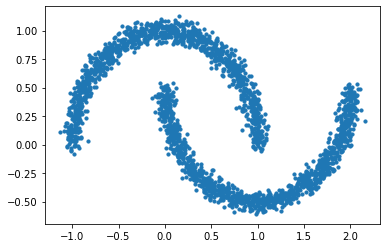

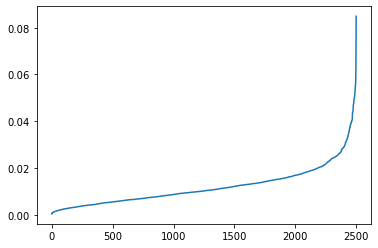

Clusters : 



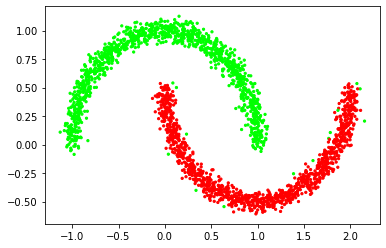

In [32]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn import datasets


#Importing dataset
x,y = datasets.make_moons(n_samples=2500, noise=0.05)


x1 = x[:, 0]
x2 = x[:, 1]

#Visualizing scattered data
plt.scatter(x1, x2, s=10)
plt.show()


#Finding optimal value of Eps
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(x)
distances, indices = nbrs.kneighbors(x)
distances = np.sort(distances, axis=0)
distances = distances[:, 1]
plt.plot(distances)
plt.show()



#Training with DBSCAN Model
model = DBSCAN(eps=0.050)
model.fit(x)
y_pred = model.labels_.astype(np.int)



#Visualization of clusters
colors = np.array(['#ff0000','#00ff00'])
print('Clusters : \n')
plt.scatter(x1,x2,s=5, color=colors [y_pred])
plt.show()

# HIERARCHICAL CLUSTERING

**In heirarchical clustering, similar objects are group together in a groups called *clusters*. There exist top-down(Divisive method) and bottom-up(Agglomerative method) for heirarchical clustering**

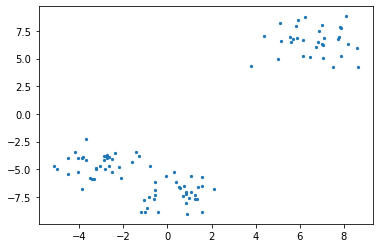

[[6.00000000e+00 2.40000000e+01 8.07762003e-02 2.00000000e+00]
 [2.00000000e+01 6.40000000e+01 9.21285696e-02 2.00000000e+00]
 [2.80000000e+01 7.70000000e+01 1.00766439e-01 2.00000000e+00]
 [2.90000000e+01 9.80000000e+01 1.01146428e-01 2.00000000e+00]
 [3.70000000e+01 7.30000000e+01 1.04497551e-01 2.00000000e+00]
 [1.20000000e+01 7.20000000e+01 1.04990559e-01 2.00000000e+00]
 [0.00000000e+00 5.60000000e+01 1.25367210e-01 2.00000000e+00]
 [4.00000000e+00 4.60000000e+01 1.25973223e-01 2.00000000e+00]
 [5.00000000e+00 2.30000000e+01 1.36025660e-01 2.00000000e+00]
 [9.60000000e+01 1.01000000e+02 1.50589090e-01 3.00000000e+00]
 [7.00000000e+00 4.10000000e+01 1.85098293e-01 2.00000000e+00]
 [5.00000000e+01 5.70000000e+01 1.86236259e-01 2.00000000e+00]
 [1.80000000e+01 4.40000000e+01 2.09528790e-01 2.00000000e+00]
 [1.90000000e+01 6.70000000e+01 2.20155379e-01 2.00000000e+00]
 [3.30000000e+01 1.07000000e+02 2.21808977e-01 3.00000000e+00]
 [6.20000000e+01 9.70000000e+01 2.27617119e-01 2.000000

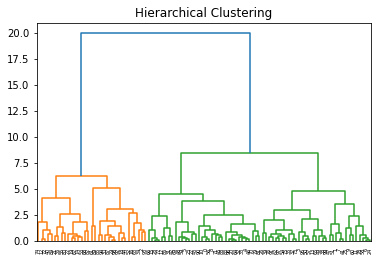

In [4]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.datasets.samples_generator import make_blobs


#Extracting dataset
x,y = make_blobs(n_samples=100)
x1=x[:, 0]
x2=x[:, 1]


#Visualizing scattered plot
plt.scatter(x1, x2, s=5)
plt.show()



#Finding nearest point using linkage_matrix
linkage_matrix = linkage(x, "complete")
print(linkage_matrix)


#Visualizing dendrogram
dendrogram = dendrogram(linkage_matrix, truncate_mode=None)
plt.title("Hierarchical Clustering")
plt.show()

# CUSTOMER SEGMENTATION

Read and understand the data of customer of retailer, implement ML algorithm to draw useful results for ***Business growth and development***.

2011-12-09 12:50:00


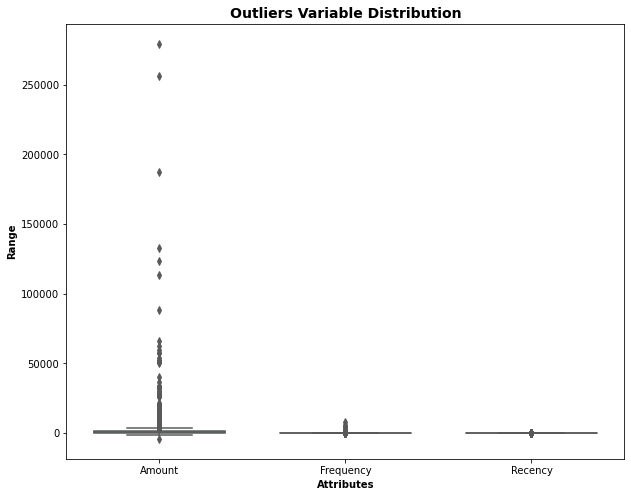

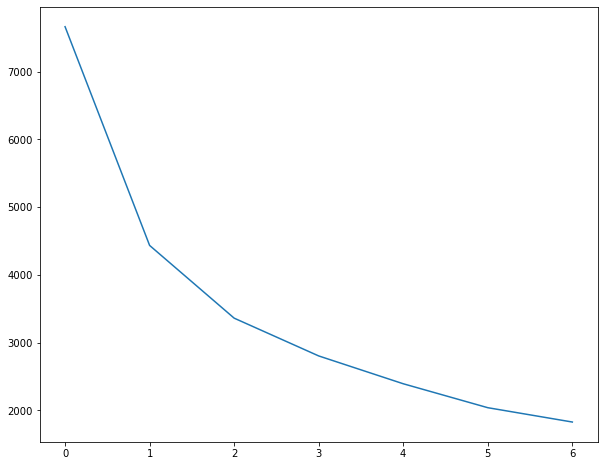

In [40]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math


#Importing dataset
dataset=pd.read_csv("E:\\ML Zero to Hero\\OnlineRetail\\OnlineRetail.csv", sep=",", encoding="ISO-8859-1", header=0)
#print(dataset.head())


#print(dataset.shape)
#print(dataset.info())
#print(dataset.describe())


#===============         DATA CLEANING             ==========#

#Find percentage of null values in eac column
null_percen = round(100*((dataset.isnull().sum(axis=0))/len(dataset)), 2)
#print(null_percen)

dataset = dataset.dropna()
#print(dataset.shape)

#Converting customer ID into string
dataset["CustomerID"] = dataset["CustomerID"].astype(str)
dataset.head()


#==============           DATA PREPARATION             ===========#

#customers can be analyzed on the basis of three factors Recency, Frequency, Monetary



#Defining new column Amount ie Amount = QUantity * Unitprice
dataset["Amount"] = dataset["Quantity"]*dataset["UnitPrice"]


#Finding total amound spent by each customer
rfm_m = dataset.groupby("CustomerID")["Amount"].sum()
#Resetting index
rfm_m = rfm_m.reset_index()


#Defining the new column frequencing ie total envoie for each customer
rfm_f = dataset.groupby('CustomerID')['InvoiceNo'].count()
#Resetting index
rfm_f = rfm_f.reset_index()
rfm_f.columns=['CustomerID','Frequency']


#Merging two dataset ie rfm_m, rfm_f same as we do in SQL database join left
rfm = pd.merge(rfm_m, rfm_f, on='CustomerID', how='inner')
rfm.head()


#Defining new attribute Recency - difference of last date and last purchase of each customer
dataset['InvoiceDate'] = pd.to_datetime(dataset['InvoiceDate'], format='%d-%m-%Y %H:%M')
max_date = max(dataset['InvoiceDate'])
print(max_date)


dataset['Diff'] = max_date - dataset['InvoiceDate']
dataset.head()

#Finding recency of each customer
rfm_p = dataset.groupby('CustomerID')['Diff'].min()
rfm_p = rfm_p.reset_index()
rfm_p.head()

#Getting number of days only for Diff, not with time
rfm_p['Diff'] = rfm_p['Diff'].dt.days
rfm_p.head()


#Merging dataframes to get finalize RFM dataframes
rfm = pd.merge(rfm, rfm_p, on='CustomerID', how='inner')
rfm.columns = ['CustomerID','Amount','Frequency','Recency']
rfm.head()


#==============          OUTLIER ANALYSIS             ==============#
#Visualizng outlier
import seaborn as sbn
attributes = ['Amount','Frequency','Recency']
plt.rcParams['figure.figsize']=[10,8]
sbn.boxplot(data=rfm[attributes], orient="v", palette="Set2", whis=1.5, saturation=1, width=0.7)
plt.title("Outliers Variable Distribution", fontsize=14,fontweight='bold')
plt.ylabel("Range", fontweight='bold')
plt.xlabel("Attributes", fontweight='bold')
plt.show()



#Removing (statistical) outliers for Amount
Q1 = rfm.Amount.quantile(0.05)
Q3 = rfm.Amount.quantile(.95)
IQR = Q3 - Q1
rfm = rfm[(rfm.Amount >= Q1 - 1.5*IQR) & (rfm.Amount <= Q3 + 1.5*IQR)]

#Removing (statistical) outliers for Recency
Q1 = rfm.Recency.quantile(0.05)
Q3 = rfm.Recency.quantile(.95)
IQR = Q3 - Q1
rfm = rfm[(rfm.Recency >= Q1 - 1.5*IQR) & (rfm.Recency <= Q3 + 1.5*IQR)]


#Removing (statistical) outliers for Frequency
Q1 = rfm.Frequency.quantile(0.05)
Q3 = rfm.Frequency.quantile(.95)
IQR = Q3 - Q1
rfm = rfm[(rfm.Frequency >= Q1 - 1.5*IQR) & (rfm.Frequency <= Q3 + 1.5*IQR)]



#===================        RESCALING ATTRIBUTES          ===================#
from sklearn.preprocessing import StandardScaler
rfm_df = rfm[['Amount','Frequency','Recency']]
scaler = StandardScaler()
rfm_df_scaled = scaler.fit_transform(rfm_df)
rfm_df_scaled.shape

#Converting into datas=frame
rfm_df_scaled=pd.DataFrame(rfm_df_scaled)
rfm_df_scaled.columns=['Amount','Frequency','Recency']
rfm_df_scaled.head()




#Now we have successfully capture useful information from the dataset


#===========================================          TRAINING OUR MODEL                ====================================#
# REASON:
# KMeans Clustering is one of the simplest and popular unsupervised machine learning algorithm


#Importing KMeans Clustering model
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=4, max_iter=50)
kmeans.fit(rfm_df_scaled)
kmeans.labels_

#Finding Optimal number of clusters
"""ssd=[]
range_n_clusters = [2,3,4,5,6,7,8]
for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(rfm_df_scaled)
    
    ssd.append(kmeans.inertia_)
    
plt.plot(ssd)"""




#Silhoutter Analysis
from sklearn.metrics import silhouette_score
range_n_clusters=[2,3,4,5,6,7,8]
for num_clusters in range_n_clusters:
    
    #initialize kmeans
    kmeans = KMeans(n_clusters=num_clusters, max_iter=50)
    kmeans.fit(rfm_df_scaled)
    
    cluster_labels = kmeans.labels_
    
    #Silhoutte score
    silhoutter_avg = silhouette_score(rfm_df_scaled, cluster_labels)
    print("For n_clusters={0}, the silhouette score is {1}".format(num_clusters, silhoutter_avg))

# AGAIN

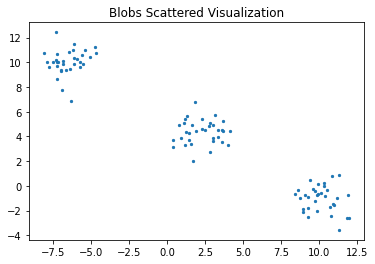

[[4.10000000e+01 9.40000000e+01 3.08632850e-02 2.00000000e+00]
 [6.00000000e+00 4.90000000e+01 6.91398497e-02 2.00000000e+00]
 [4.70000000e+01 8.30000000e+01 9.17453318e-02 2.00000000e+00]
 [2.50000000e+01 3.50000000e+01 1.02677580e-01 2.00000000e+00]
 [5.70000000e+01 8.90000000e+01 1.30726741e-01 2.00000000e+00]
 [1.70000000e+01 4.60000000e+01 1.61320923e-01 2.00000000e+00]
 [7.00000000e+00 1.00000000e+02 1.93895890e-01 3.00000000e+00]
 [1.50000000e+01 6.60000000e+01 1.95675731e-01 2.00000000e+00]
 [7.10000000e+01 8.50000000e+01 2.03092346e-01 2.00000000e+00]
 [8.00000000e+00 9.80000000e+01 2.11060811e-01 2.00000000e+00]
 [5.20000000e+01 8.80000000e+01 2.11179858e-01 2.00000000e+00]
 [7.50000000e+01 8.20000000e+01 2.17433377e-01 2.00000000e+00]
 [3.00000000e+00 8.10000000e+01 2.19290695e-01 2.00000000e+00]
 [1.40000000e+01 7.80000000e+01 2.30560499e-01 2.00000000e+00]
 [4.20000000e+01 7.90000000e+01 2.38298208e-01 2.00000000e+00]
 [2.40000000e+01 5.80000000e+01 2.42302811e-01 2.000000

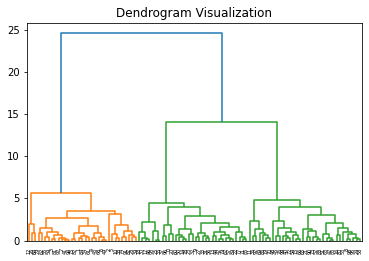

In [8]:
#importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
from scipy.cluster.hierarchy import linkage,dendrogram
from sklearn.datasets import samples_generator



#Importing dataset
x, y = make_blobs(n_samples=100)
x1=x[:,0]
x2=x[:,1]


#Visualizing scatter plot
plt.scatter(x1, x2, s=5)
plt.title("Blobs Scattered Visualization")
plt.show()



#Getting linkage_matrix implementing nearest distance algorithm
linkage_matrix = linkage(x, "complete")
print(linkage_matrix)



#Visualizing dendrogram
dendrogram = dendrogram(linkage_matrix, truncate_mode=None)
plt.title("Dendrogram Visualization")
plt.show()